In [1]:
%cd ../..

/home/eli/AnacondaProjects/epych


In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import collections
import glob
import functools
import logging
import math
import matplotlib.pyplot as plt
import numpy as np
import os
import pickle
import quantities as pq

import epych
from epych.statistics import alignment, grand

In [4]:
%matplotlib inline

In [5]:
logging.basicConfig(level=logging.INFO)

In [6]:
CONDITIONS = ["go_gloexp", "go_seqctl", "lo_gloexp", "lonaive", "lo_rndctl", "igo_seqctl"]
PRETRIAL_SECONDS = 0.5
POSTTRIAL_SECONDS = 0.5

In [7]:
NWB_SUBJECTS = glob.glob('/mnt/data/DRAFT/000253/sub-*/')

In [8]:
PILOT_FILES = []

In [9]:
aligner = epych.statistics.alignment.AlignmentSummary.unpickle("/mnt/data/DRAFT/000253/visual_alignment")

In [10]:
PVALUE = 1e-2

In [11]:
CONTRASTS = [("logo", "lo_gloexp", "go_gloexp"), ("go_contrast", "go_gloexp", "go_seqctl"), ("lo_contrast", "lo_gloexp", "lo_rndctl"), ("ssa", "lo_gloexp", "igo_seqctl"), ("dd", "lo_rndctl", "lonaive")]

In [12]:
def initialize_grand_cluster_test(key, signals):
    area = os.path.commonprefix([loc for loc in signals[0].channels.location])
    return epych.statistics.grand.GrandNonparametricClusterTest(aligner.stats[area], alpha=PVALUE, partitions=1000)

In [13]:
summaries = {}

In [14]:
def location_prefix_signal_key(probe, signals):
    return alignment.location_prefix(probe, signals[0])

In [15]:
contrasts = {}

In [16]:
# for (contrast, condl, condr) in CONTRASTS:
#     summaries[contrast] = epych.statistic.Summary(location_prefix_signal_key, initialize_grand_cluster_test)
#     condl_lfps = epych.recording.Sampling.unpickle("/mnt/data/000253/grandcat_%s" % condl)
#     condr_lfps = epych.recording.Sampling.unpickle("/mnt/data/000253/grandcat_%s" % condr)
#     logging.info("Loaded cross-subject LFPs for contrast %s" % contrast)
#     contrast_signals = {k: (condl_lfps.signals[k], condr_lfps.signals[k]) for k in condl_lfps.signals.keys()}
#     summaries[contrast].calculate([contrast_signals])
#     contrasts[contrast] = summaries[contrast].results()
#     logging.info("Nonparametrically contrasted for %s" % contrast)
#     del condl_lfps, condr_lfps

In [17]:
subtractions = {}

In [18]:
# for cond in CONDITIONS:
#     subtractions[cond] = epych.recording.Sampling.unpickle("/mnt/data/DRAFT/000253/grandcat_4-3_%s" % cond)
#     logging.info("Loaded cross-subject adaption-adjusted LFPs for condition %s" % cond)

In [19]:
area_titles = {
    "VISal": "AL",
    "VISam": "AM",
    "VISl": "LM",
    "VISp": "V1",
    "VISpm": "PM",
    "VISrl": "RL",
}
def stattitle(name, signal):
    if name in area_titles:
        return area_titles[name]
    return name

In [20]:
ADAPTED_ONSET = pq.Quantity(-1.0) * pq.second
ADAPTED_OFFSET = pq.Quantity(-0.5) * pq.second
ODDBALL_ONSET = pq.Quantity(-1.9017372477960602e-14) * pq.second
ODDBALL_OFFSET = pq.Quantity(0.5004545430388676) * pq.second
EVENTS = {
    "Onset": (ODDBALL_ONSET.magnitude, 'lightgreen'),
    "Offset": (ODDBALL_OFFSET.magnitude, 'red'),
}

In [21]:
for (name, _, _) in CONTRASTS:
    summaries[name] = epych.statistic.Summary.unpickle(name + '_4minus3', epych.statistics.grand.GrandNonparametricClusterTest)
    logging.info("Loaded nonparametrically contrasted inner subtractions for %s" % name)

INFO:root:Loaded nonparametrically contrasted inner subtractions for logo
INFO:root:Loaded nonparametrically contrasted inner subtractions for go_contrast
INFO:root:Loaded nonparametrically contrasted inner subtractions for lo_contrast
INFO:root:Loaded nonparametrically contrasted inner subtractions for ssa
INFO:root:Loaded nonparametrically contrasted inner subtractions for dd


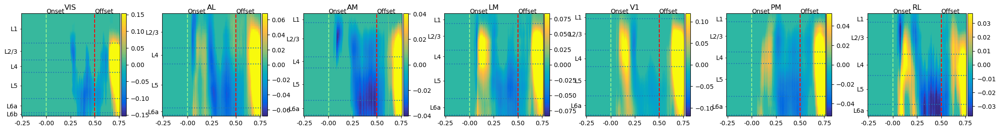

discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]


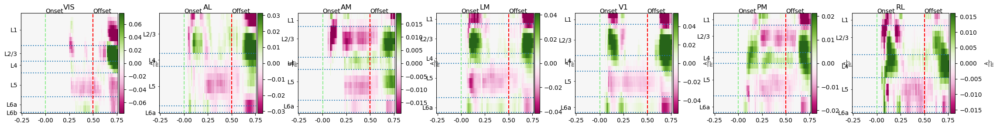

INFO:root:Plotted grand cluster-corrected test contrasts for logo


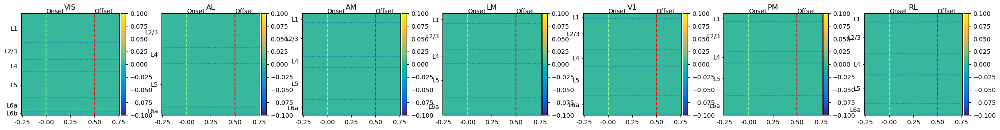

discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]


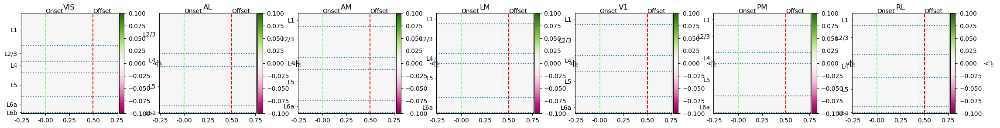

INFO:root:Plotted grand cluster-corrected test contrasts for go_contrast


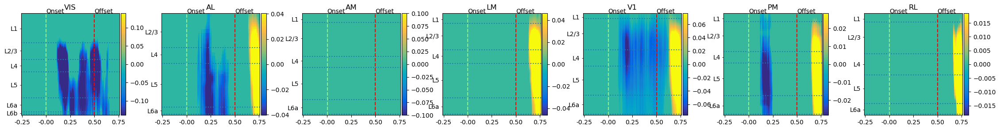

discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]


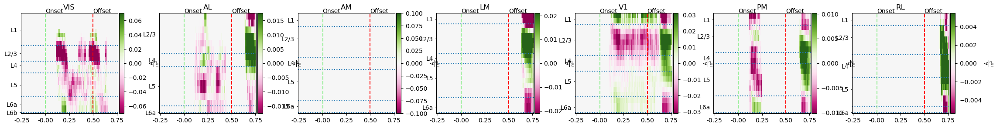

INFO:root:Plotted grand cluster-corrected test contrasts for lo_contrast


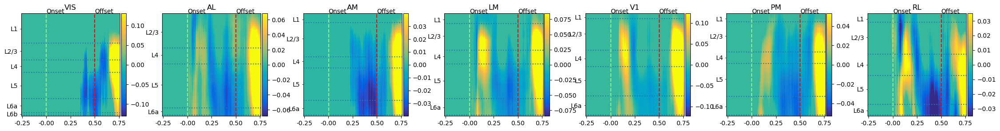

discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]


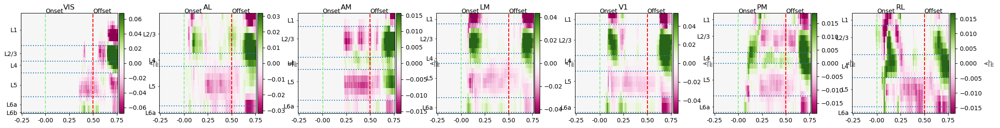

INFO:root:Plotted grand cluster-corrected test contrasts for ssa


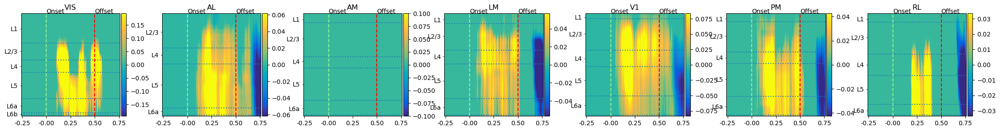

discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]


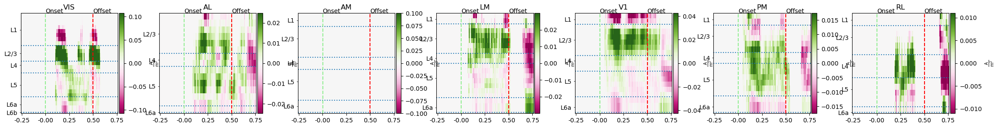

INFO:root:Plotted grand cluster-corrected test contrasts for dd


In [22]:
for (name, condl, condr) in CONTRASTS:
    summaries[name].plot(figure=name + "_4minus3_all_lfps.svg", stattitle=stattitle, events=EVENTS)

    summaries[name].plot(cmap='PiYG', fmask=lambda mask: mask[::4, :], fsig=lambda sig: sig.downsample(4).current_source_density(depth_column="vertical"),
                         figure=name + "_4minus3_all_csds.svg", stattitle=stattitle, events=EVENTS)
    logging.info("Plotted grand cluster-corrected test contrasts for %s" % name)

In [23]:
anatomical_areas = ['VISp', 'VISl', 'VISrl', 'VISal', 'VISpm', 'VISam']

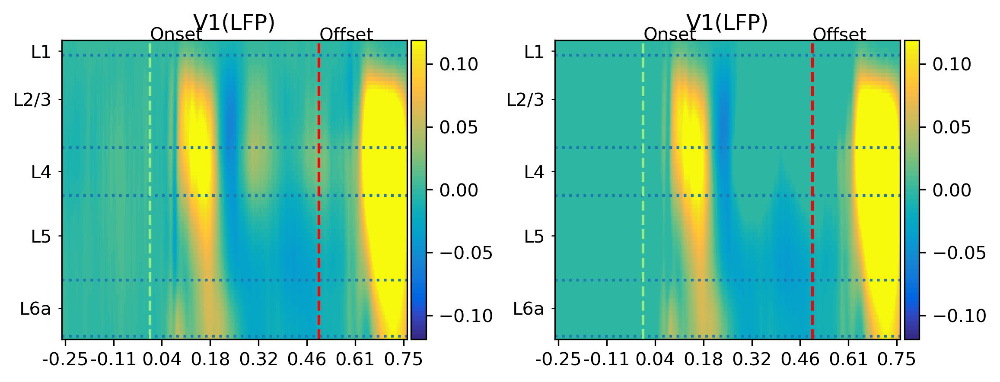

discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]


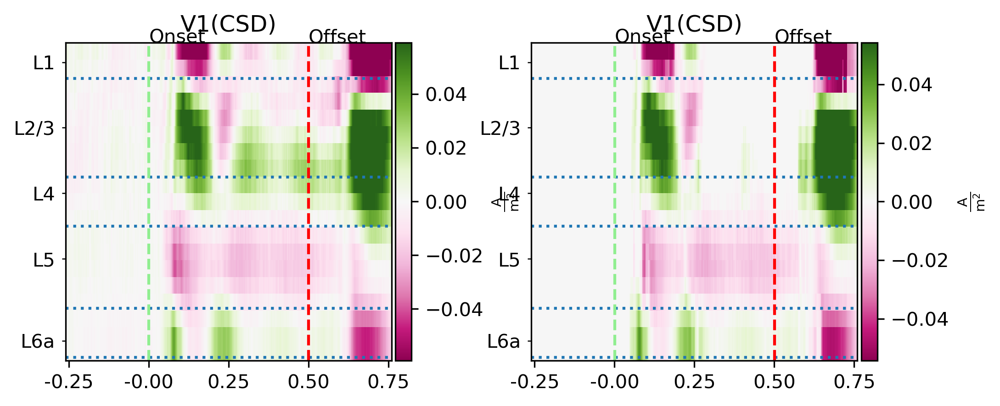

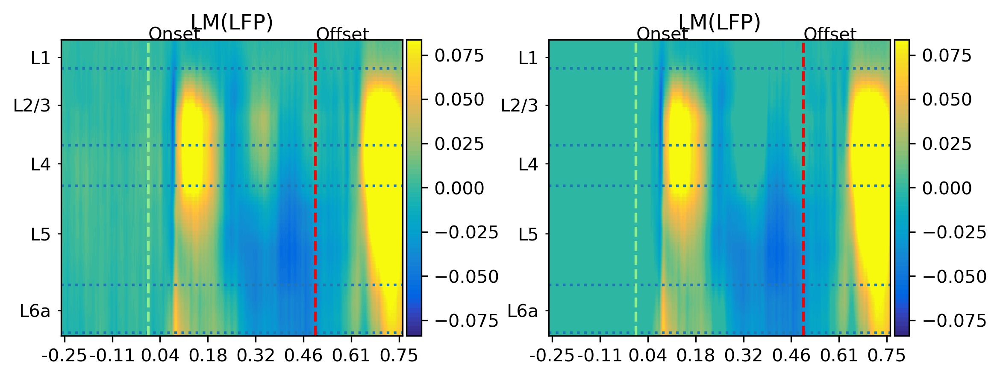

discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]


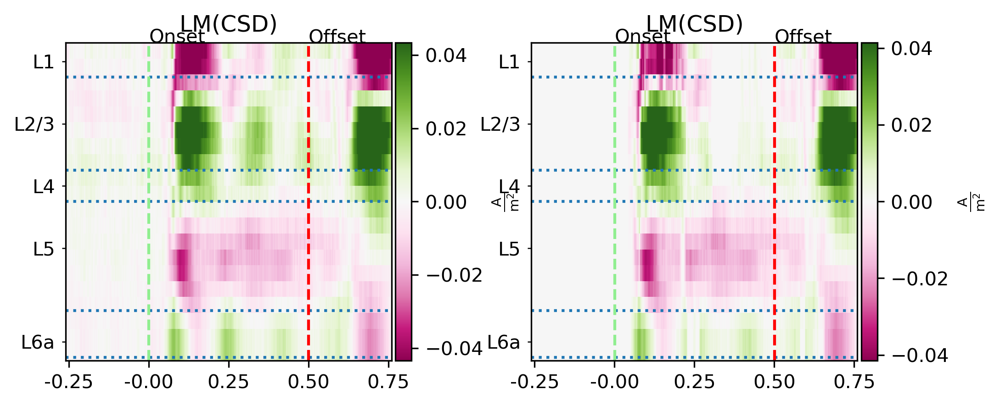

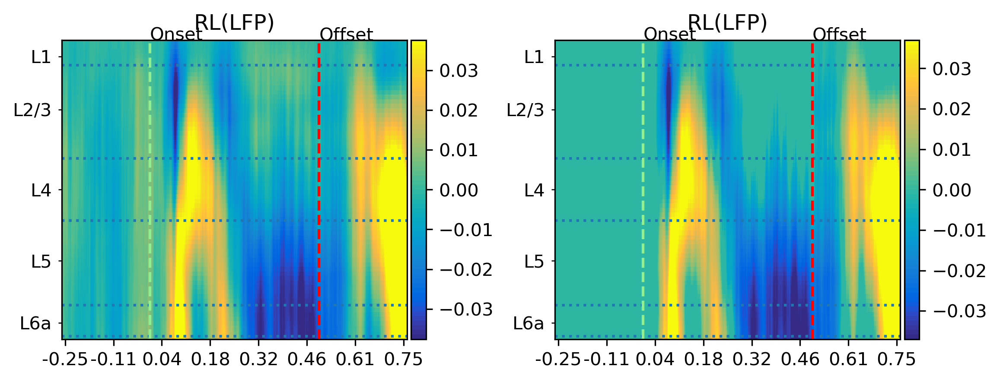

discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]


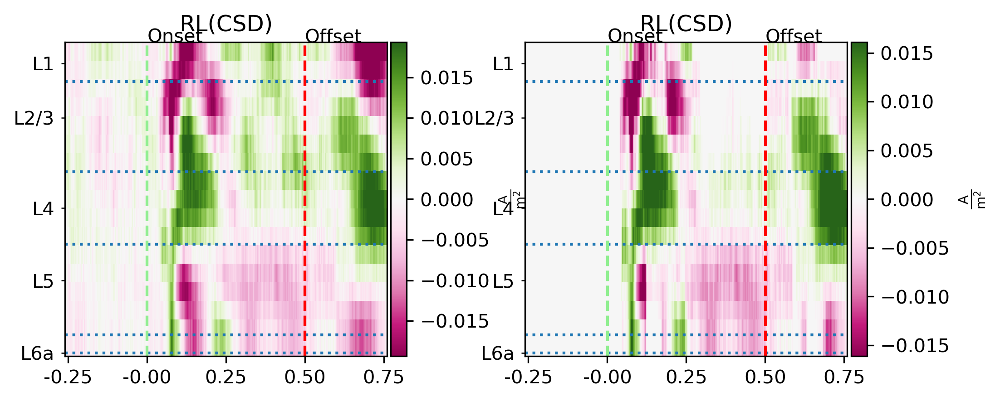

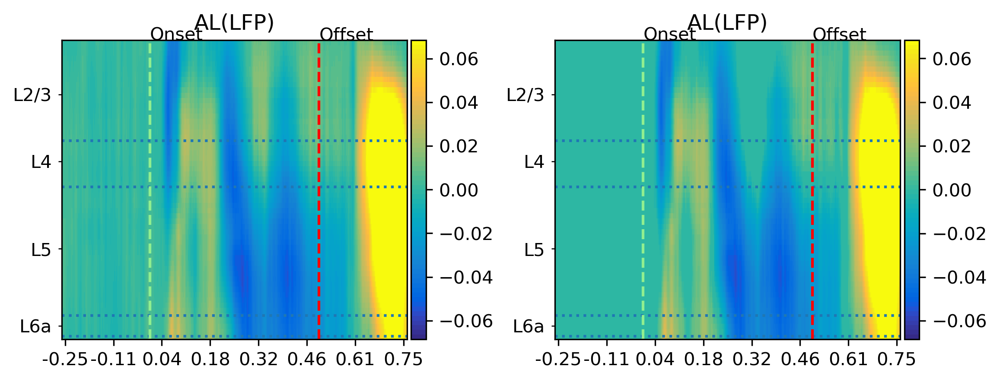

discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]


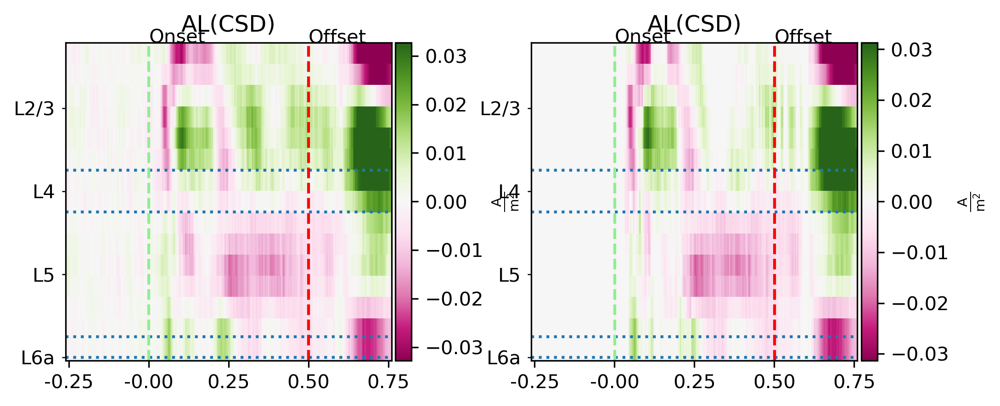

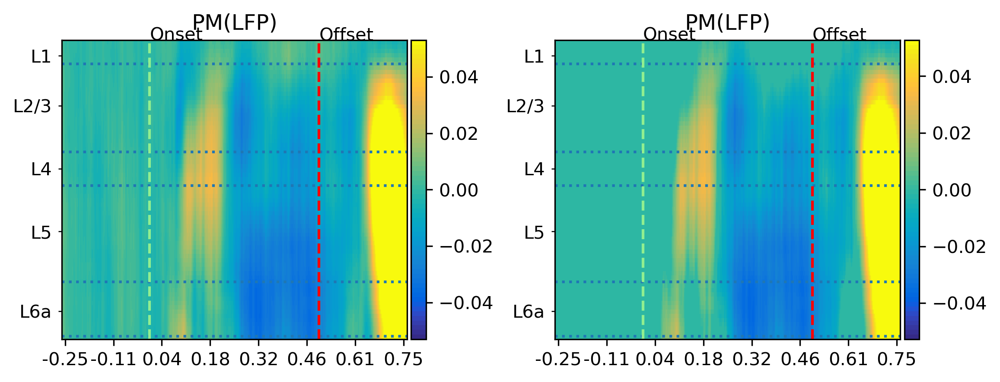

discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]


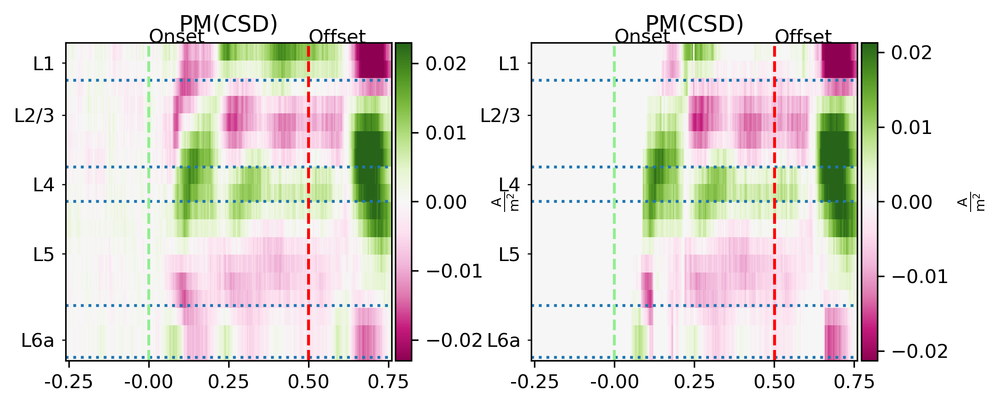

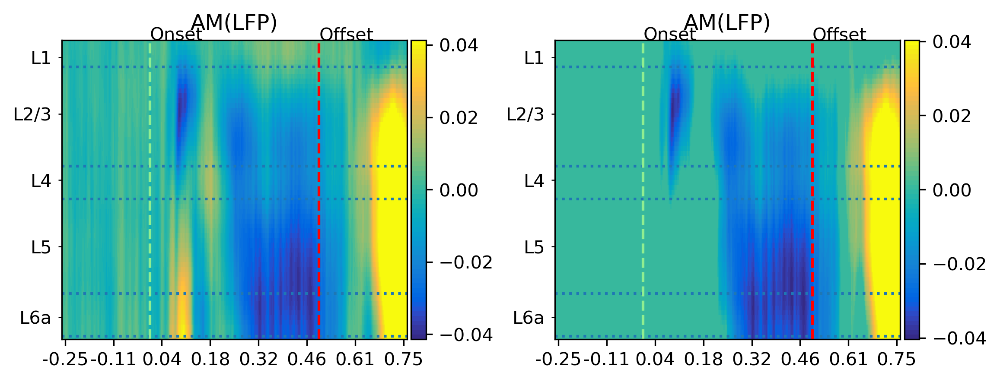

discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]


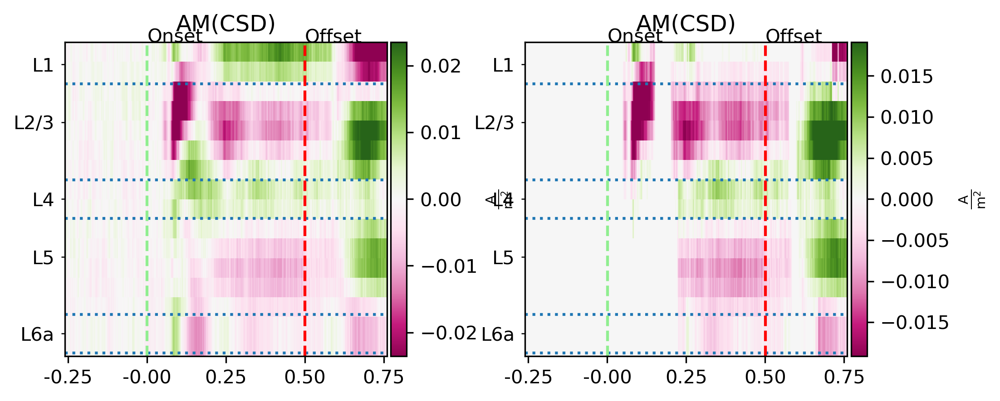

INFO:root:Plotted unmasked and masked cluster-corrected contrasts for logo


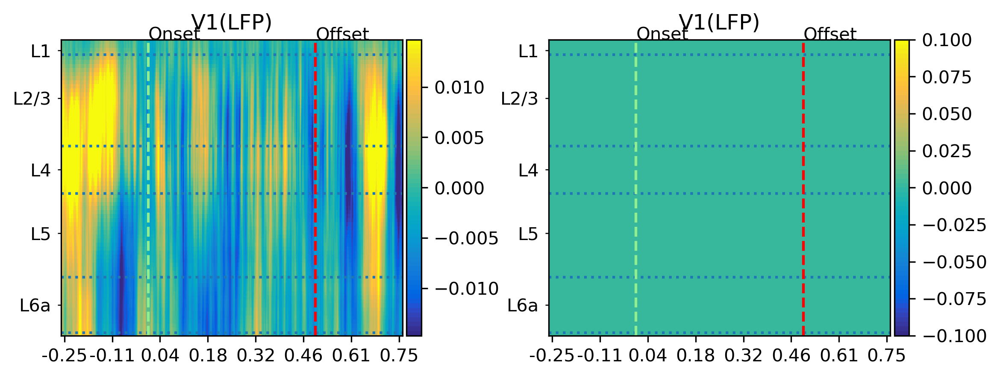

discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]


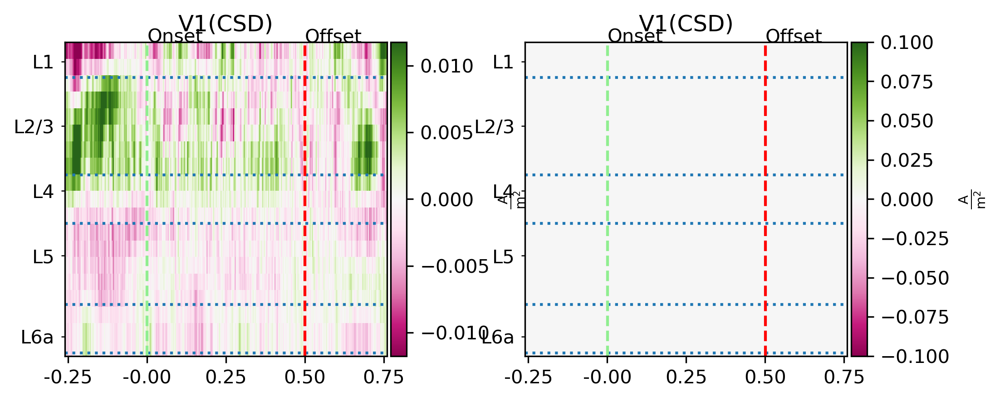

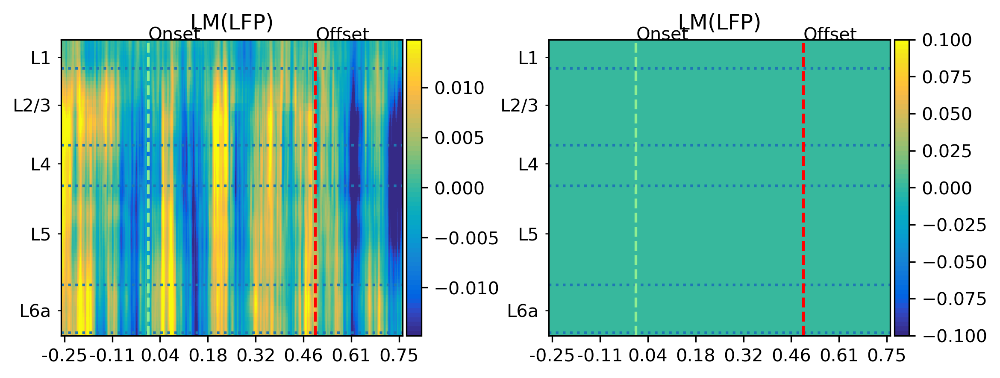

discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]


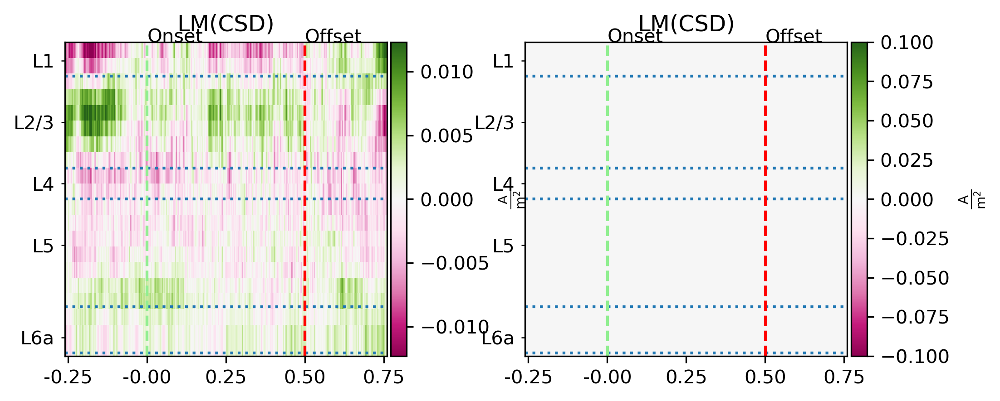

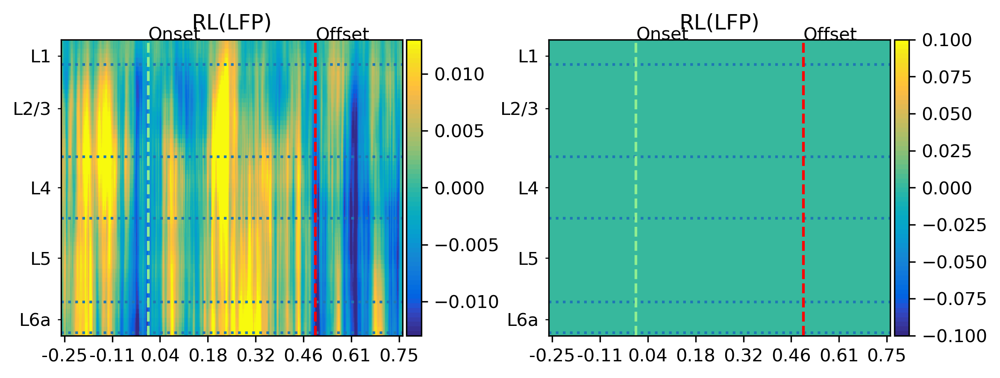

discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]


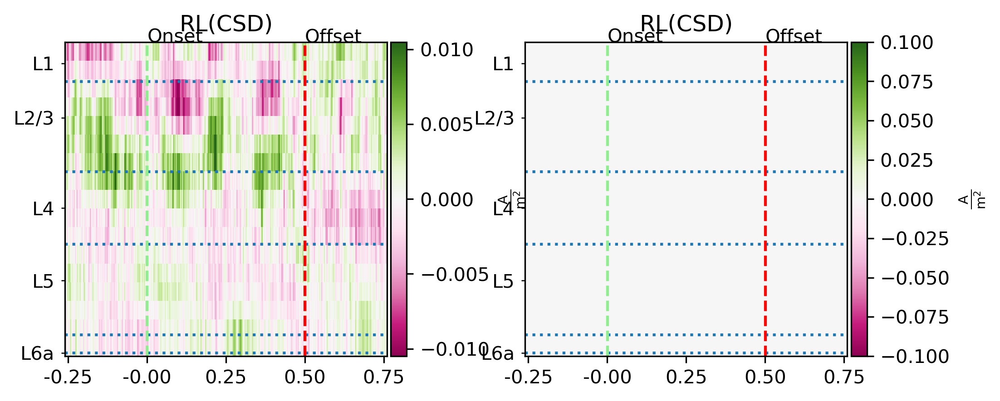

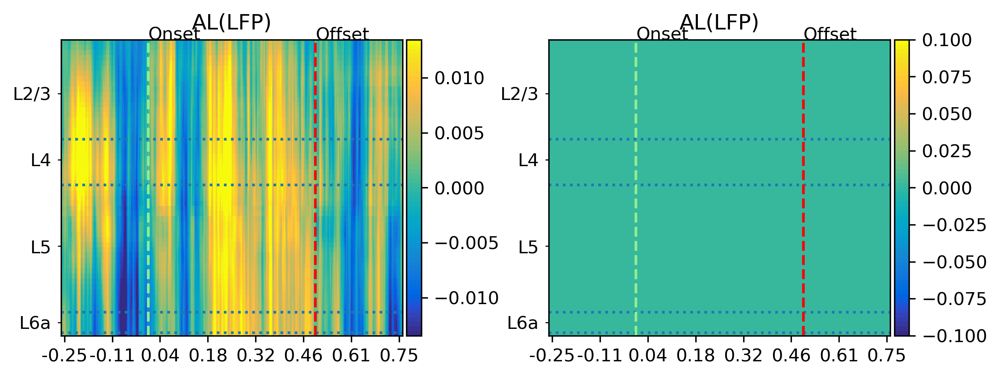

discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]


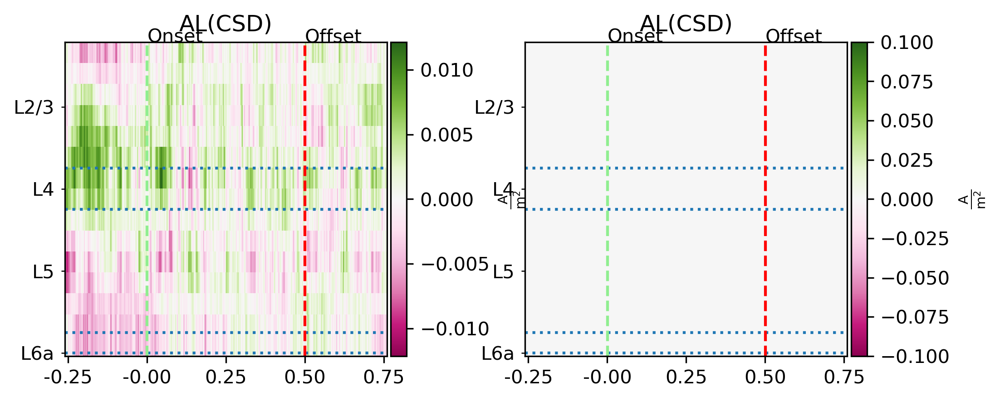

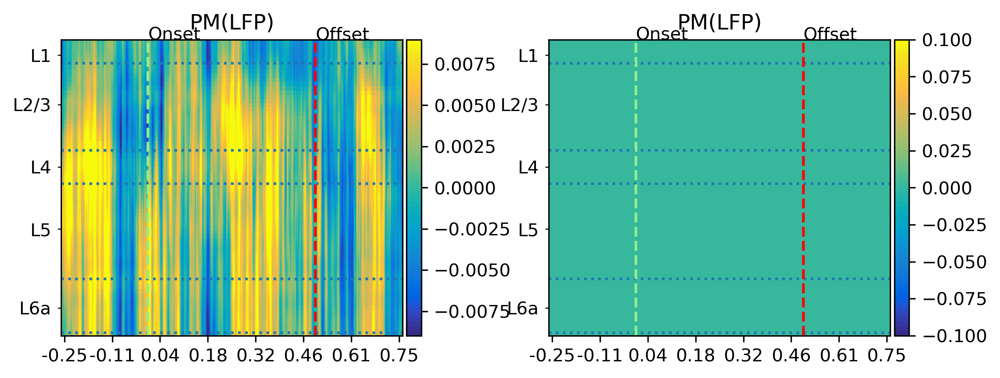

discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]


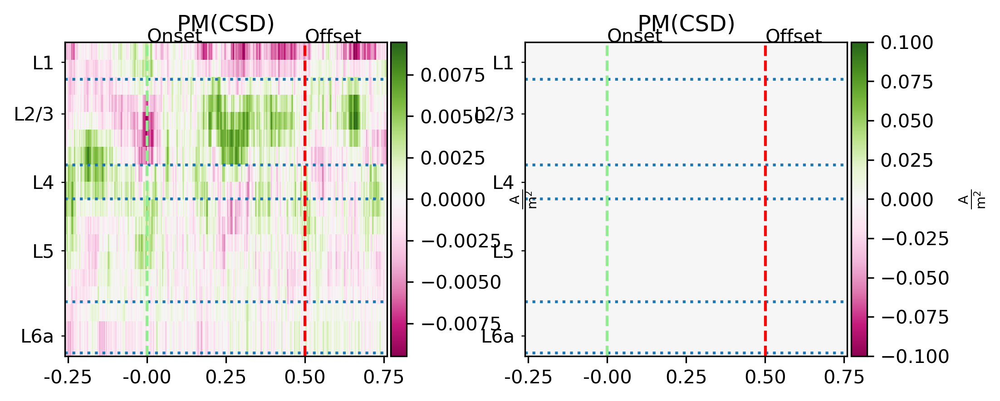

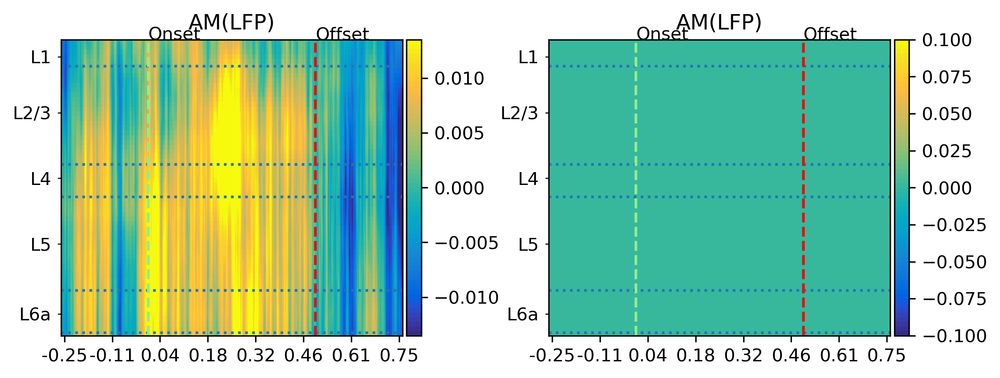

discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]


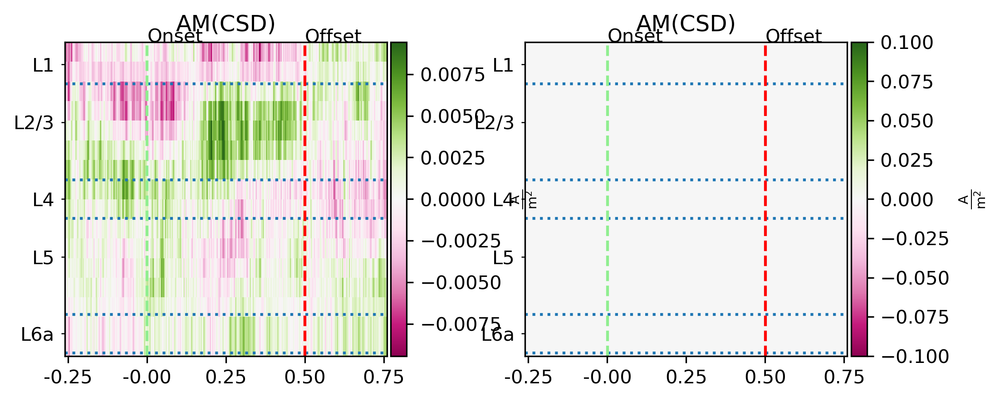

INFO:root:Plotted unmasked and masked cluster-corrected contrasts for go_contrast


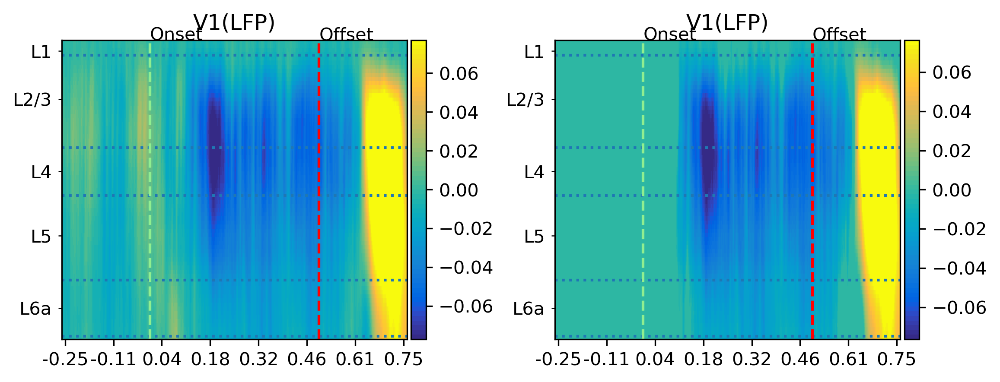

discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]


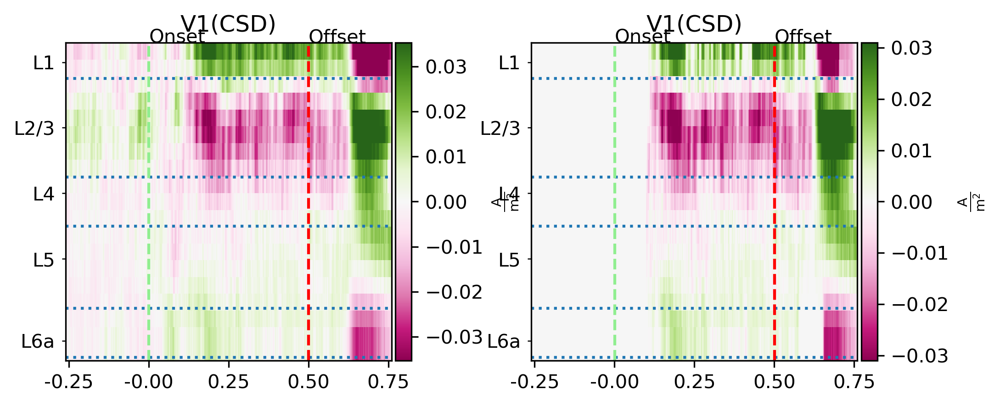

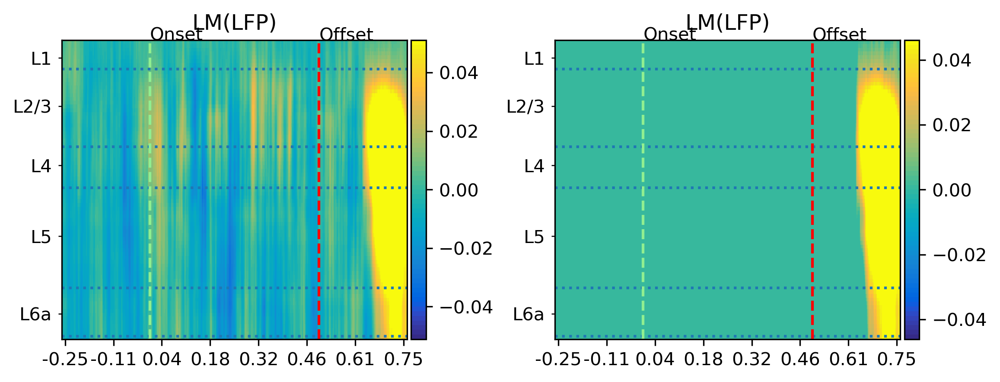

discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]


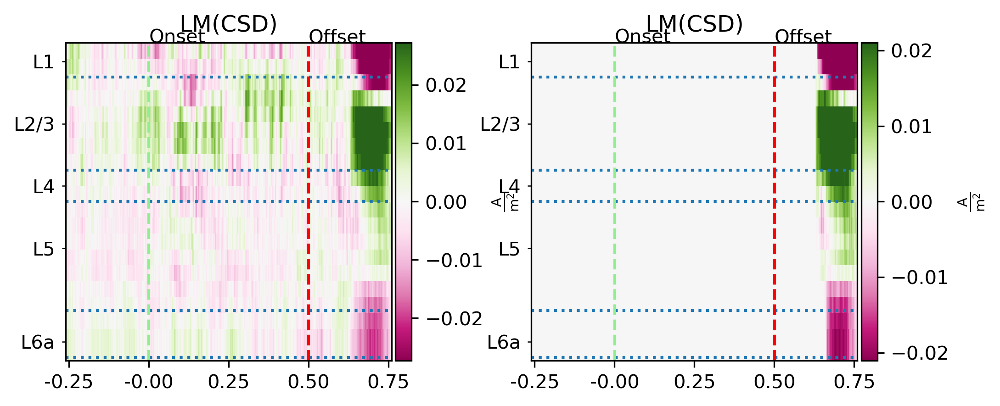

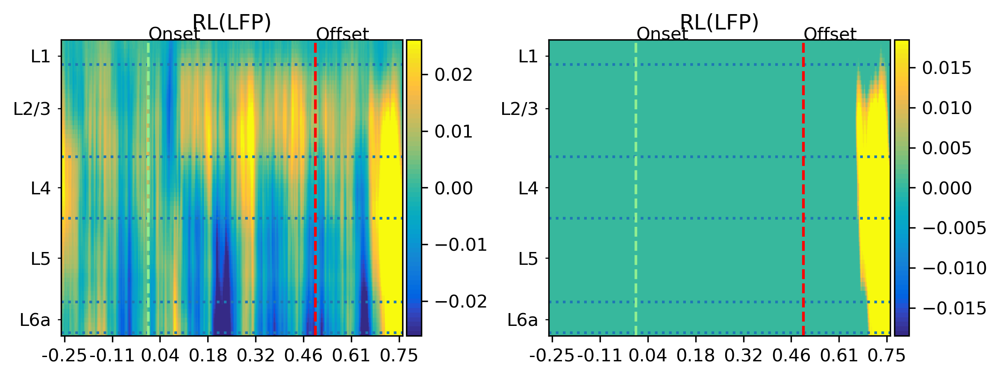

discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]


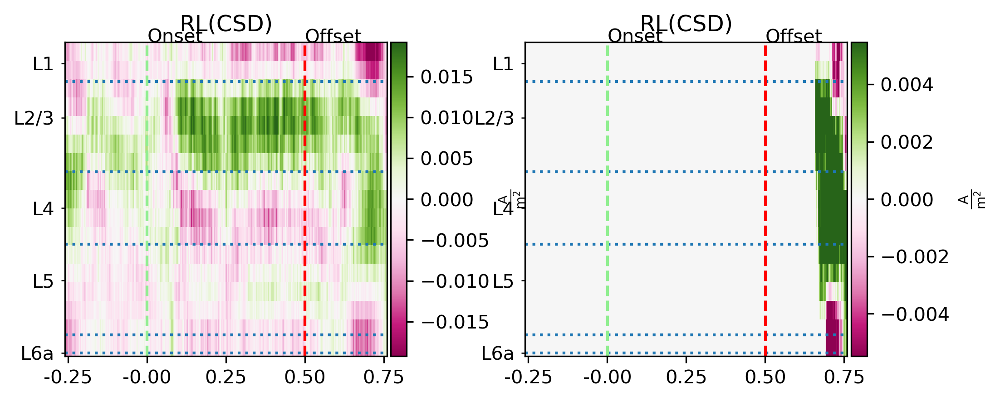

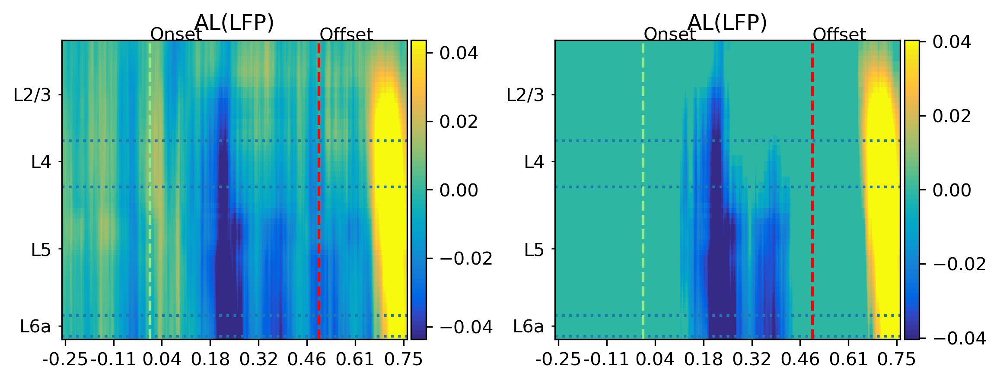

discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]


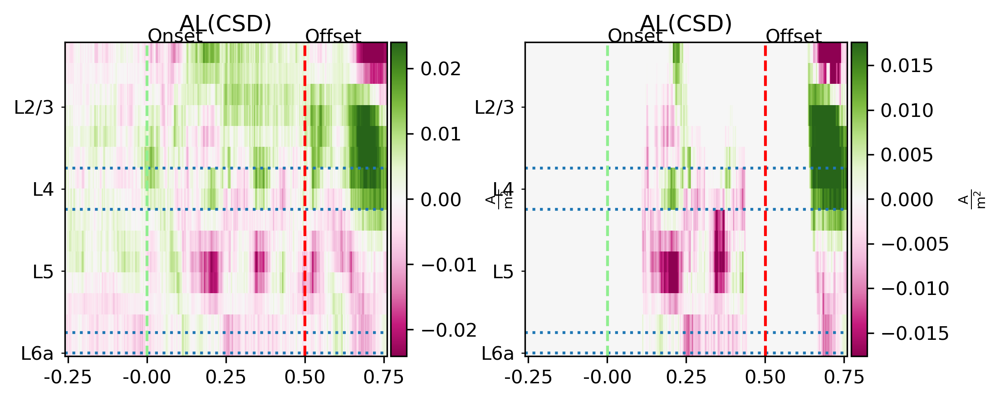

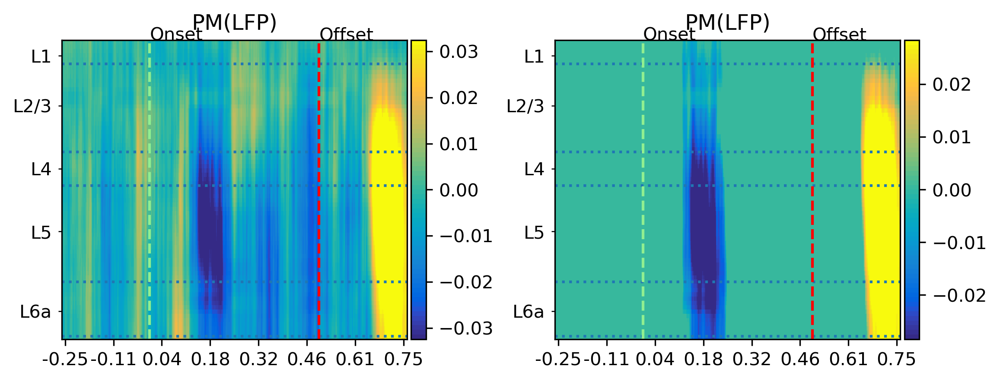

discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]


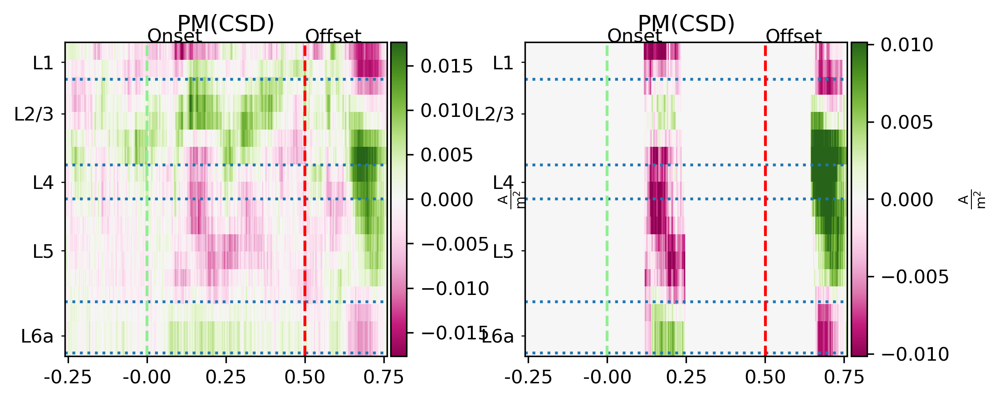

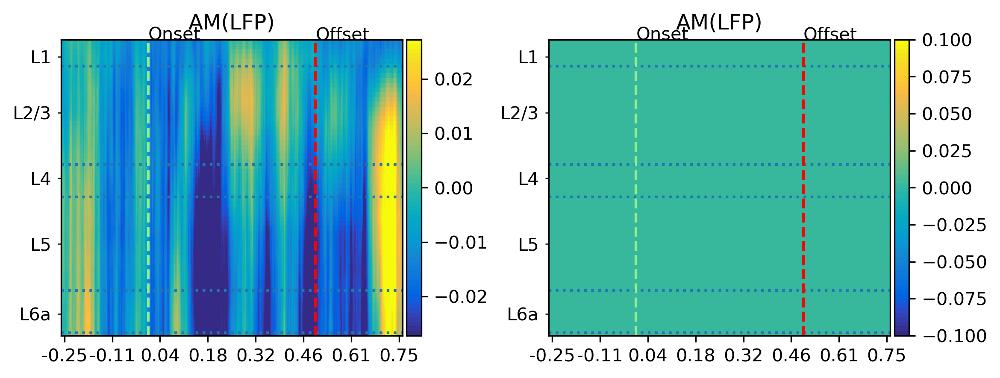

discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]


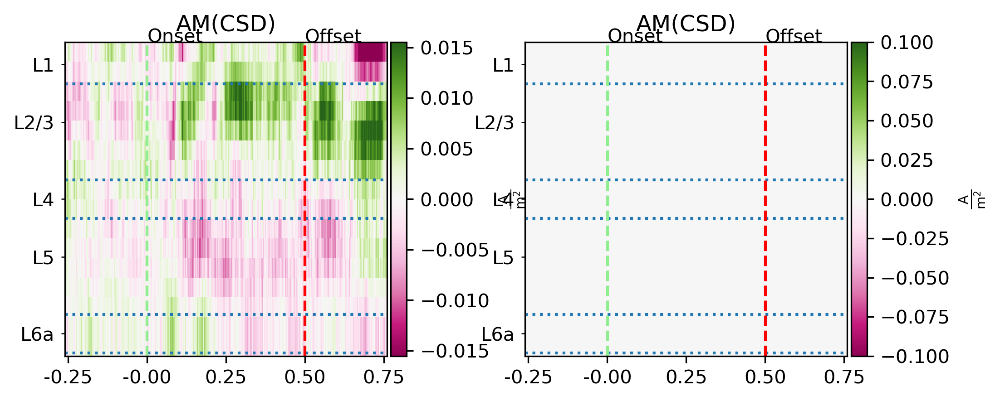

INFO:root:Plotted unmasked and masked cluster-corrected contrasts for lo_contrast


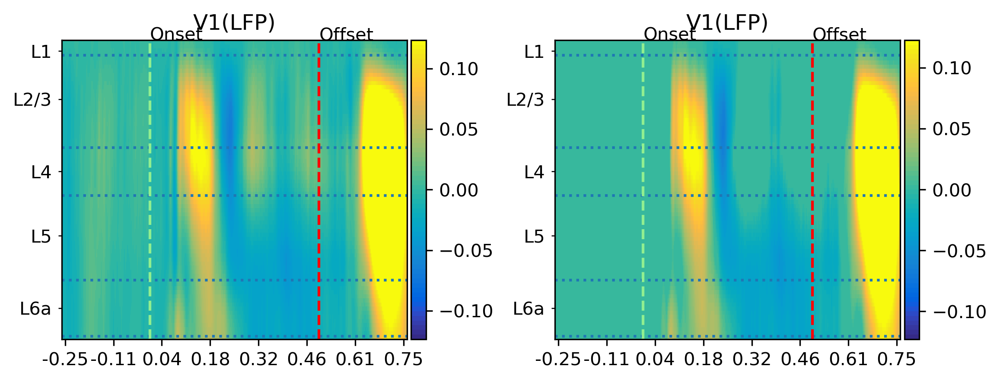

discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]


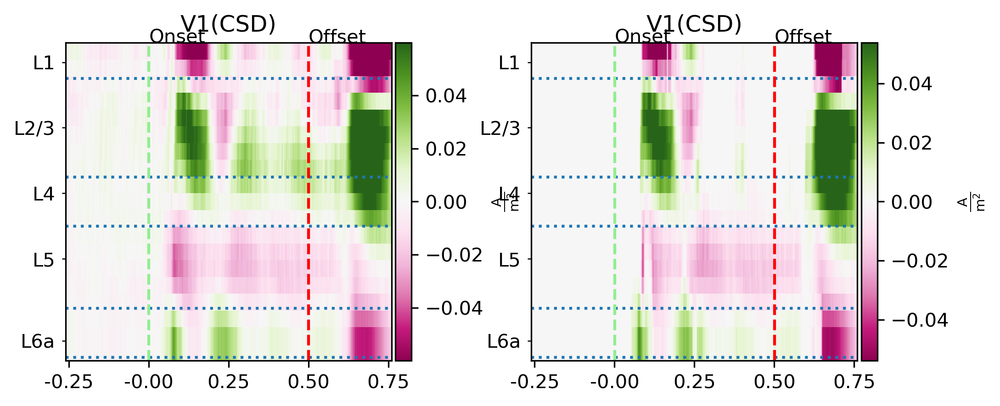

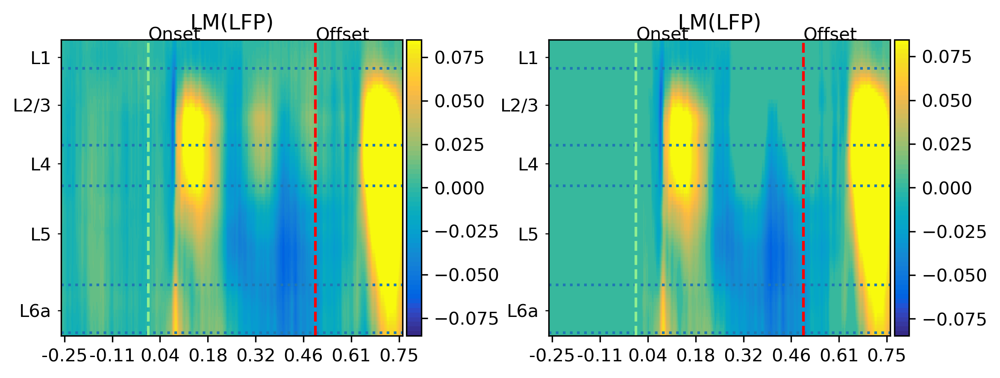

discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]


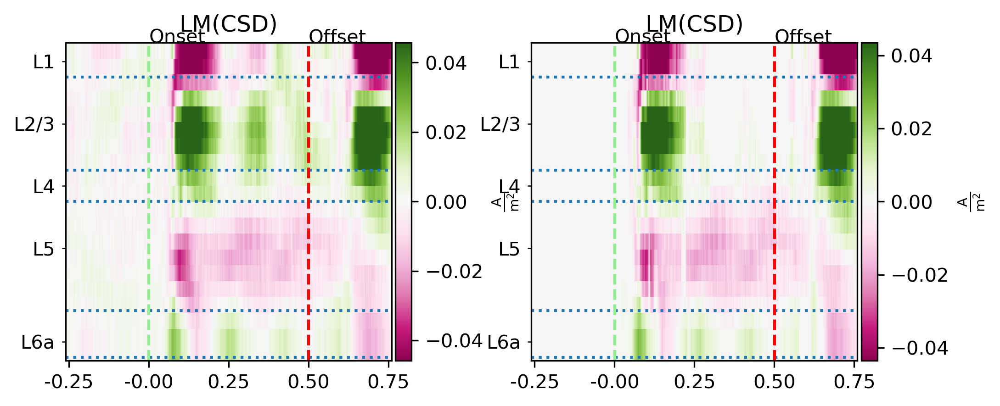

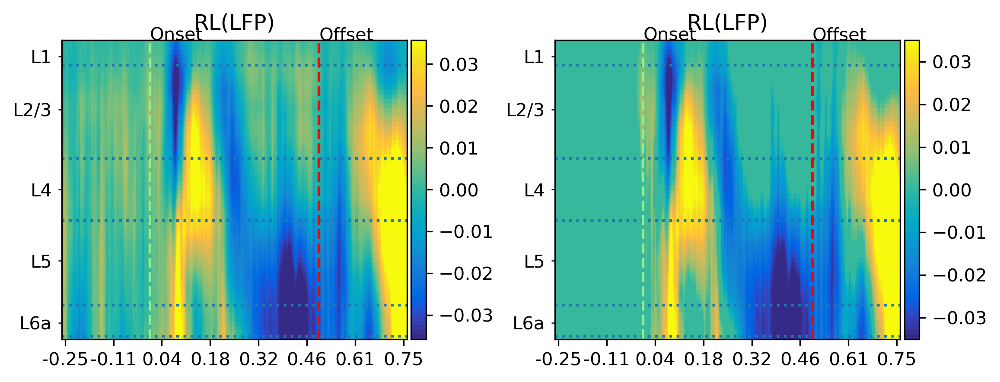

discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]


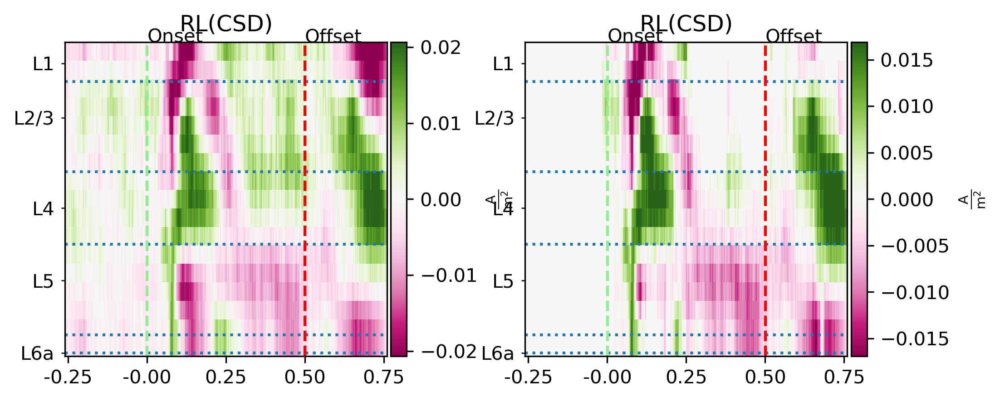

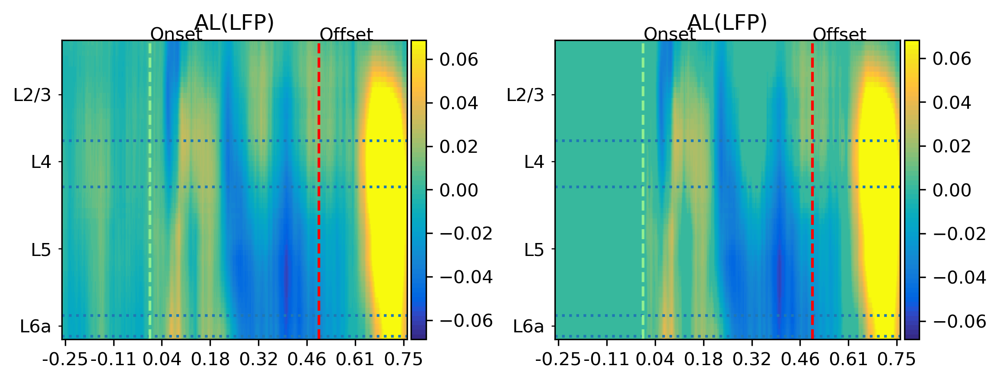

discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]


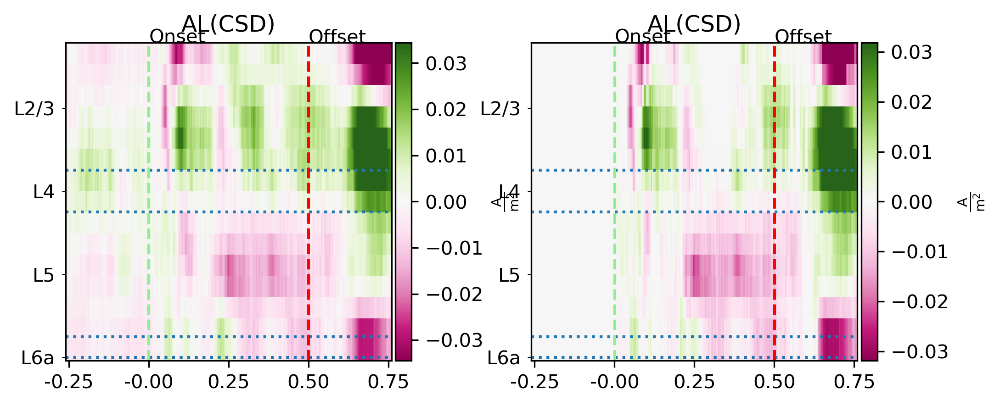

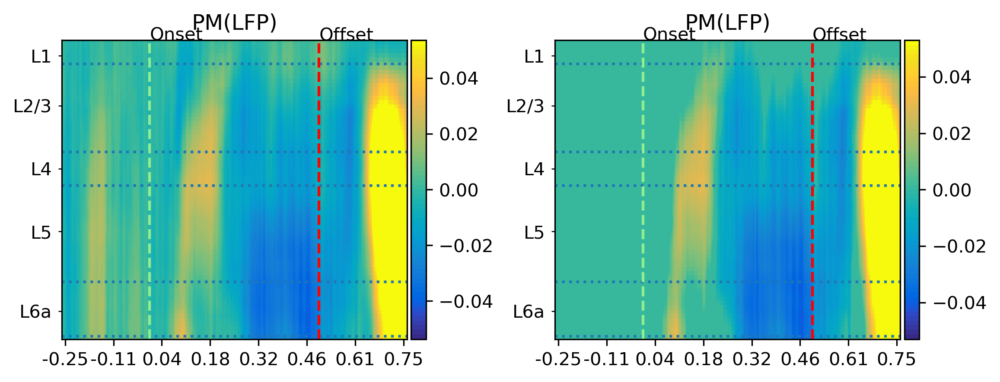

discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]


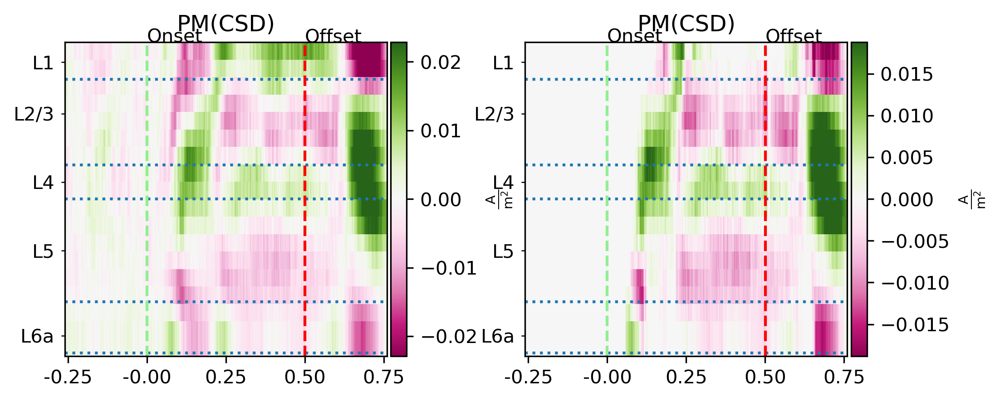

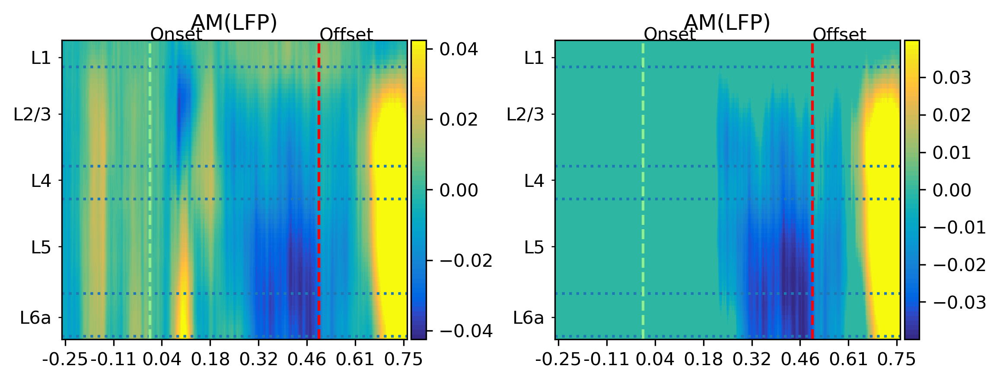

discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]


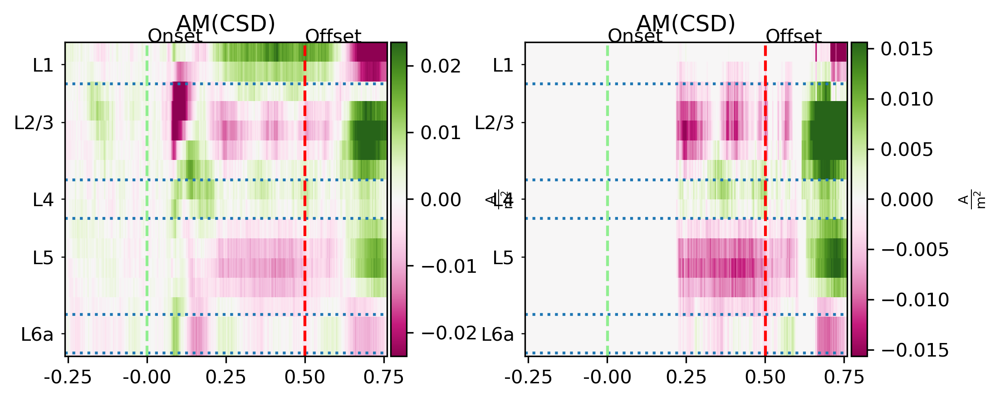

INFO:root:Plotted unmasked and masked cluster-corrected contrasts for ssa


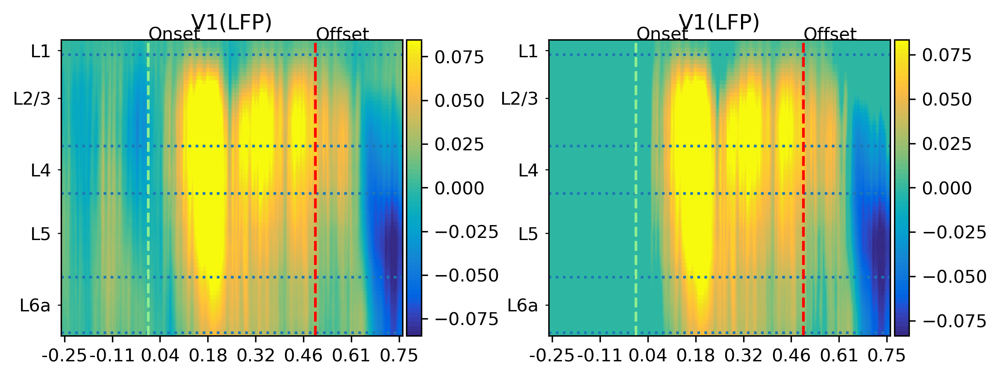

discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]


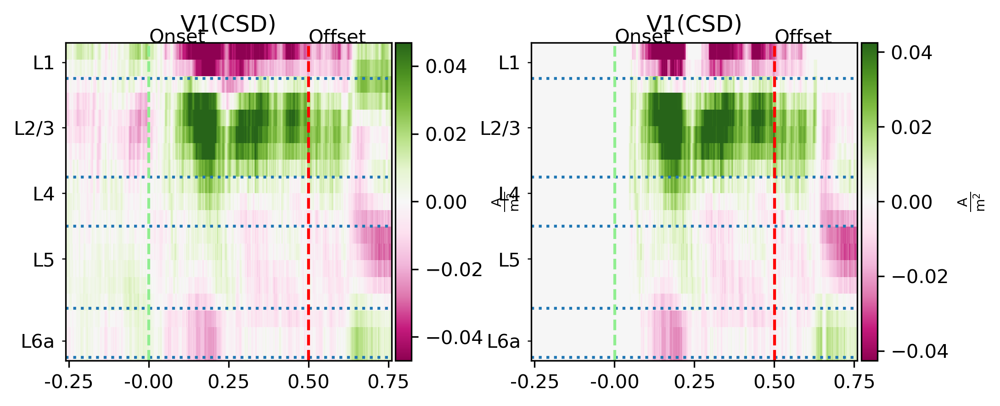

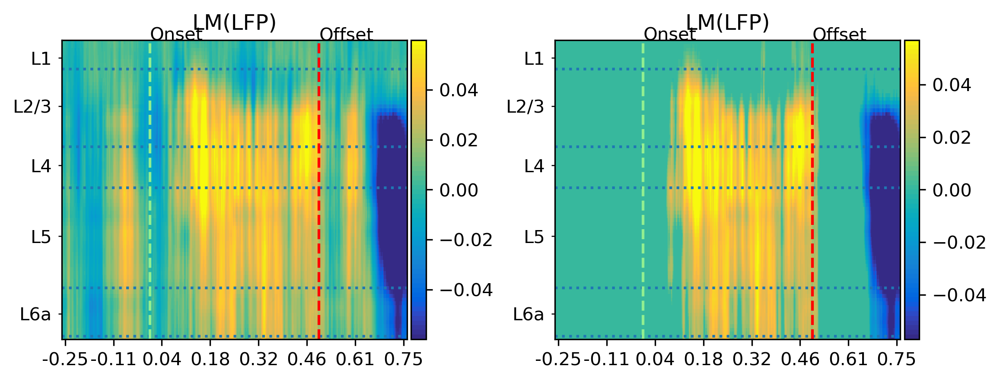

discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]


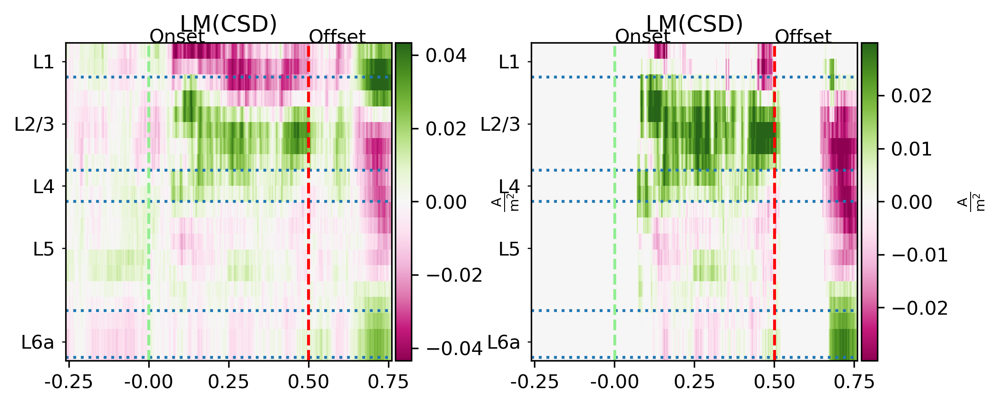

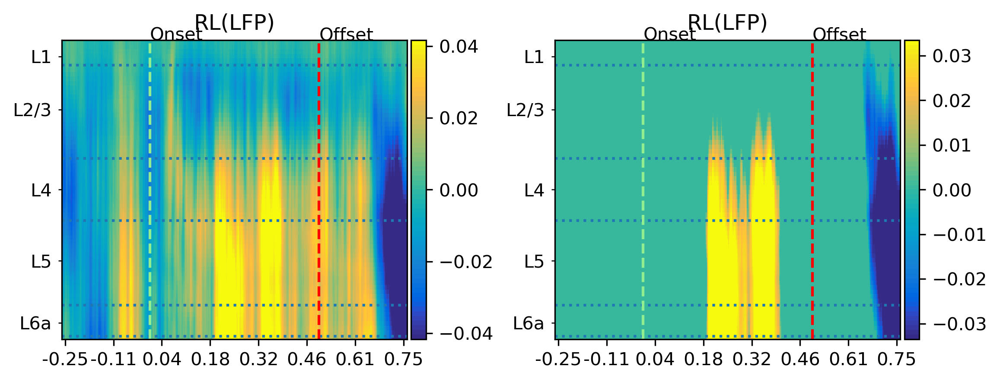

discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]


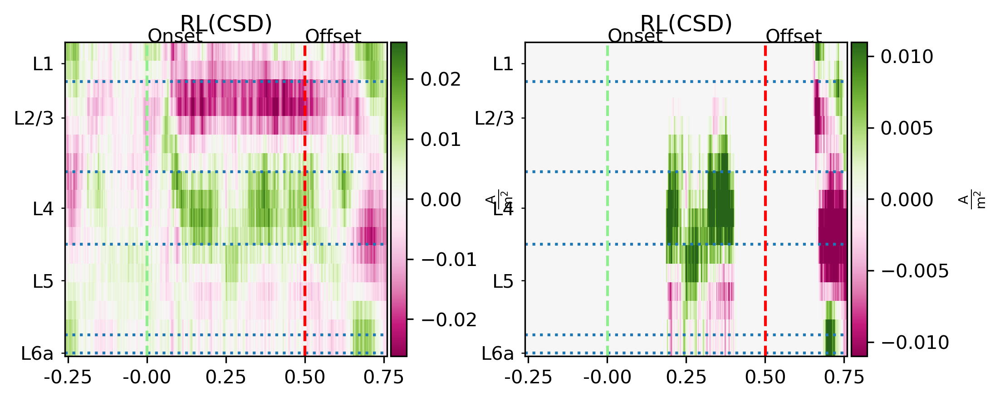

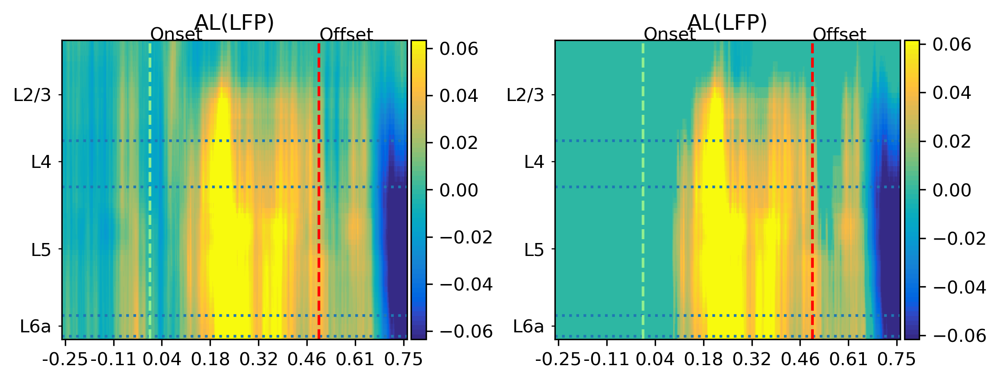

discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]


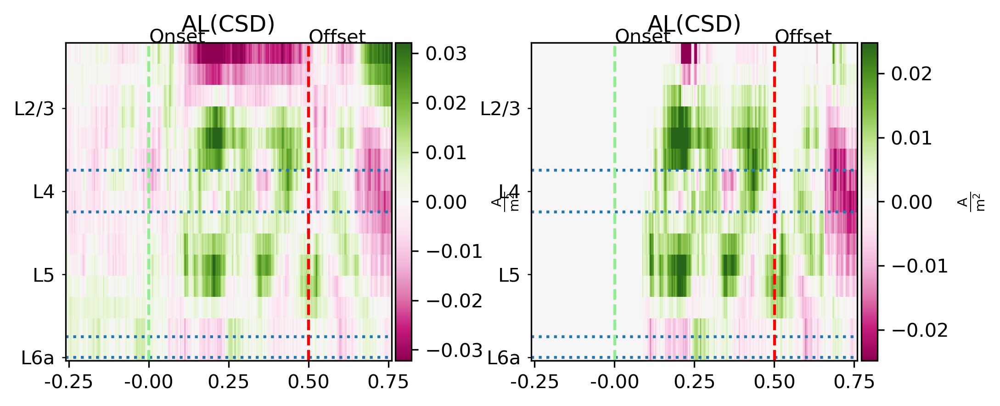

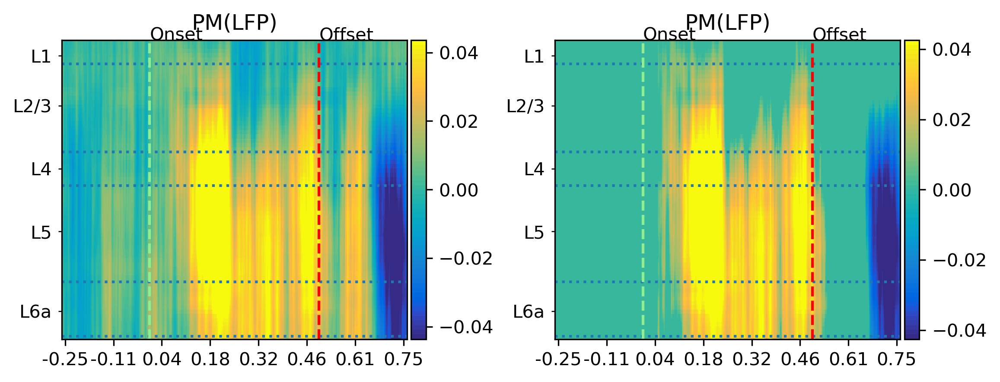

discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]


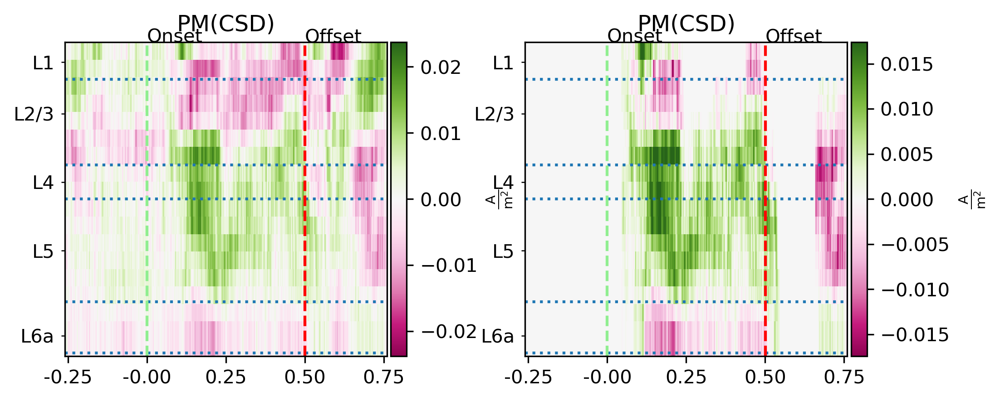

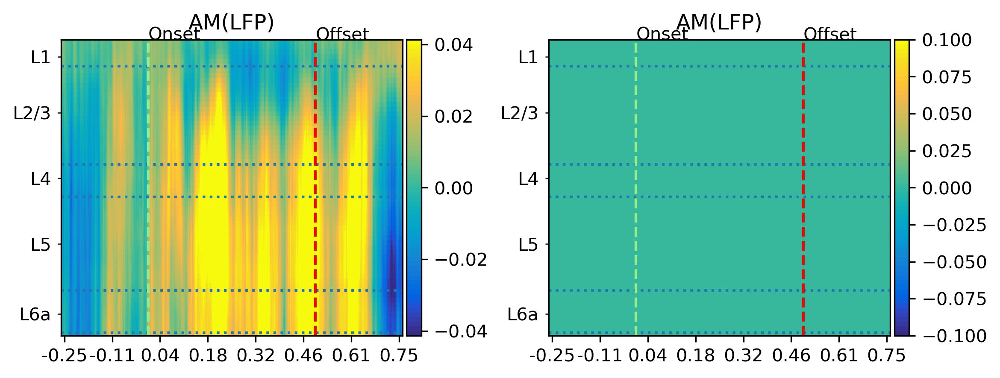

discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]


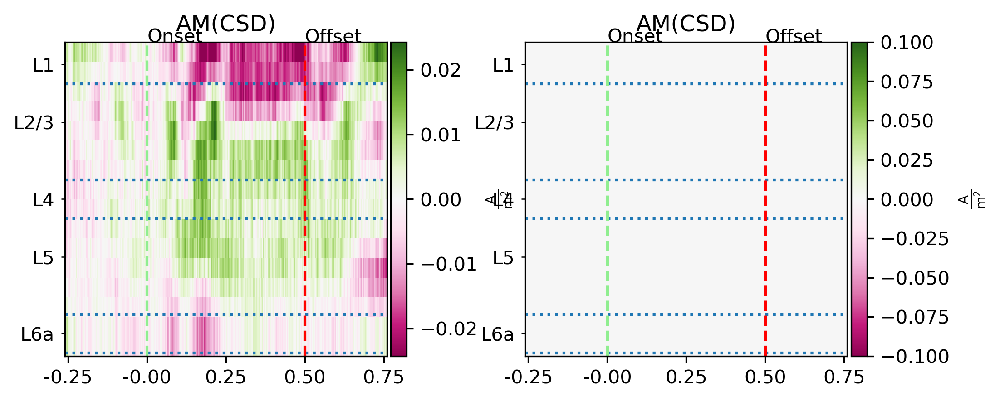

INFO:root:Plotted unmasked and masked cluster-corrected contrasts for dd


In [25]:
for (name, _, _) in CONTRASTS:
    contrast = summaries[name].results()
    for area in anatomical_areas:
        mask, lfp = contrast[area]["mask"], contrast[area]["signal"]
        masked_lfp = lfp.fmap(lambda data: data * mask[:, :, np.newaxis])
        title = area_titles[area]
        
        fig, axes = plt.subplot_mosaic([[False, True]],
                                       figsize=(9, 3), dpi=300)
        for masking, ax in axes.items():
            sig = masked_lfp if masking else lfp
            sig.plot(ax=ax, fig=fig, title=title + "(LFP)", events=EVENTS)
        plt.show()

        csd = lfp.downsample(4).current_source_density(depth_column="vertical")
        masked_csd = csd.fmap(lambda data: data * mask[::4, :, np.newaxis])

        fig, axes = plt.subplot_mosaic([[False, True]],
                                       figsize=(8, 3), dpi=300)
        for masking, ax in axes.items():
            sig = masked_csd if masking else csd
            sig.plot(cmap='PiYG', ax=ax, fig=fig, title=title + "(CSD)", events=EVENTS)
        plt.show()
    logging.info("Plotted unmasked and masked cluster-corrected contrasts for %s" % name)